In [1]:
import model_torch
import modules_torch
import _utils_torch
from Preprocessing import *
from _utils_torch import *
import loss

In [2]:
os.environ["CUDA_VISIBLE_DEVICES"] = "0"

print(torch.cuda.is_available())

True


In [3]:
base_dir = '../Data'
list_dir = os.listdir(base_dir)

train_dir = list_dir[:int(np.round(len(list_dir)*0.6))]
test_dir = list_dir[int(np.round(len(list_dir)*0.6)):]

X_train, Y_train, X_test, Y_test = preprocessing(base_dir, train_dir, test_dir)

  0%|          | 0/19 [00:00<?, ?it/s]

0.0 1.0 float32
0.0 1.0 float32
0.0 1.0 float32
0.0 1.0 float32
0.0 1.0 float32
0.0 1.0 float32
0.0 1.0 float32
0.0 1.0 float32
0.0 1.0 float32
0.0 1.0 float32
0.0 1.0 float32
0.0 1.0 float32
0.0 1.0 float32
0.0 1.0 float32
0.0 1.0 float32
0.0 1.0 float32
0.0 1.0 float32
0.0 1.0 float32
0.0 1.0 float32


  0%|          | 0/12 [00:00<?, ?it/s]

0.0 1.0 float32
0.0 1.0 float32
0.0 1.0 float32
0.0 1.0 float32
0.0 1.0 float32
0.0 1.0 float32
0.0 1.0 float32
0.0 1.0 float32
0.0 1.0 float32
0.0 1.0 float32
0.0 1.0 float32
0.0 1.0 float32


In [4]:
print(X_train.shape, X_train.min(), X_train.max(), X_train.dtype)
print(Y_train.shape, Y_train.min(), Y_train.max(), Y_train.dtype)
print(X_test.shape, X_test.min(), X_test.max(), X_test.dtype)
print(Y_test.shape, Y_test.min(), Y_test.max(), Y_test.dtype)

(4551, 512, 512) 0.0 1.0 float32
(4551, 512, 512) 0 1 int16
(2984, 512, 512) 0.0 1.0 float32
(2984, 512, 512) 0 1 int16


In [5]:
h_params=EasyDict()
h_params.gpu_num=0
h_params.seed=42

h_params.total_epoch=300
h_params.batch_size=16
h_params.lr=1e-3
h_params.lr_schedule_patience=7
h_params.earlystop_patience=20

h_params.model_name = "./output/model.pth"
h_params.model_save_base = os.path.join(os.getcwd(),"./output/train_log")

now = time.localtime(time.time())
h_params.trial_ = f"{now.tm_year}{now.tm_mon:02d}{now.tm_mday:02d}_{now.tm_hour:02d}{now.tm_min:02d}"
h_params.trial_path =os.path.join(h_params.model_save_base,h_params.trial_)
h_params.model_save_path = os.path.join(h_params.trial_path,h_params.model_name)

In [6]:
os.makedirs(h_params.trial_path, exist_ok=True)
device = torch.device(f"cuda:{h_params.gpu_num}" if torch.cuda.is_available() else 'cpu')

In [7]:
train_transform = A.Compose([
    A.ShiftScaleRotate(shift_limit=(-.15, .15),
                       scale_limit=(-.15, .15),
                       rotate_limit=(-15, 15),p=0.01),
    A.RandomBrightnessContrast(brightness_limit=0.01,
                               contrast_limit=0.01,
                               p=0.01),
    ToTensorV2()

], p=1)

val_transform = A.Compose([ToTensorV2()], p=1)

In [8]:
train_dataset = custom_dataset(img=X_train,
                               mask=Y_train,
                               transform=train_transform)

train_dataloader = DataLoader(dataset=train_dataset,
                              batch_size=h_params.batch_size,
                              shuffle=True)

torch.Size([1, 512, 512]) tensor(0.) tensor(1.) torch.float32
torch.Size([512, 512]) tensor(0.) tensor(0.) torch.float32


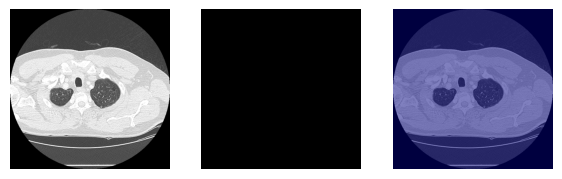

torch.Size([1, 512, 512]) tensor(0.) tensor(1.) torch.float32
torch.Size([512, 512]) tensor(0.) tensor(0.) torch.float32


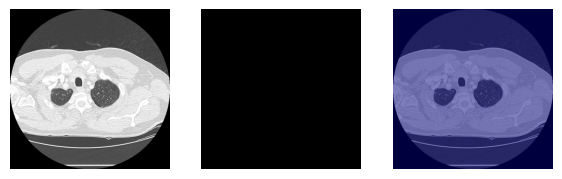

torch.Size([1, 512, 512]) tensor(0.) tensor(1.) torch.float32
torch.Size([512, 512]) tensor(0.) tensor(0.) torch.float32


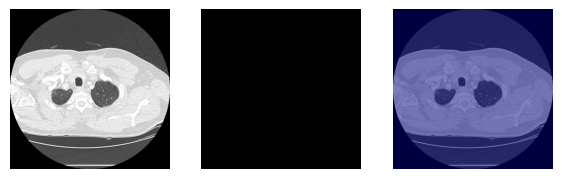

torch.Size([1, 512, 512]) tensor(0.) tensor(1.) torch.float32
torch.Size([512, 512]) tensor(0.) tensor(0.) torch.float32


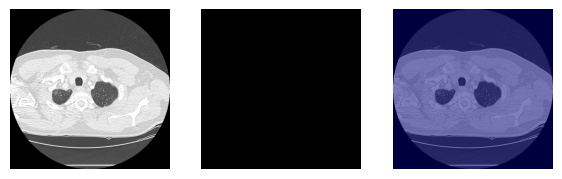

torch.Size([1, 512, 512]) tensor(0.) tensor(1.) torch.float32
torch.Size([512, 512]) tensor(0.) tensor(0.) torch.float32


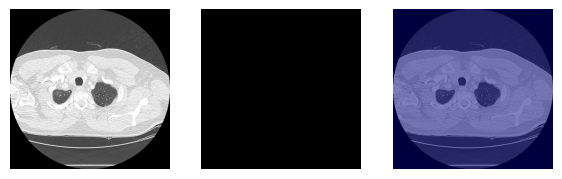

torch.Size([1, 512, 512]) tensor(0.) tensor(1.) torch.float32
torch.Size([512, 512]) tensor(0.) tensor(0.) torch.float32


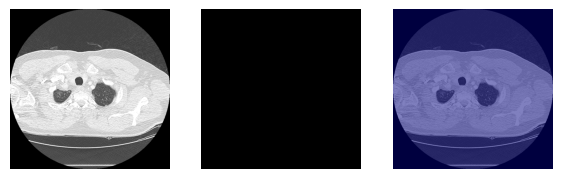

torch.Size([1, 512, 512]) tensor(0.) tensor(1.) torch.float32
torch.Size([512, 512]) tensor(0.) tensor(0.) torch.float32


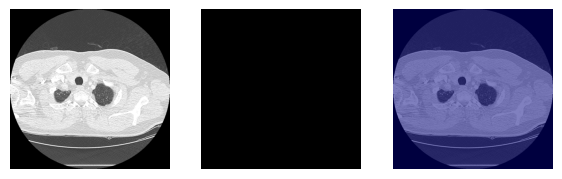

torch.Size([1, 512, 512]) tensor(0.) tensor(1.) torch.float32
torch.Size([512, 512]) tensor(0.) tensor(0.) torch.float32


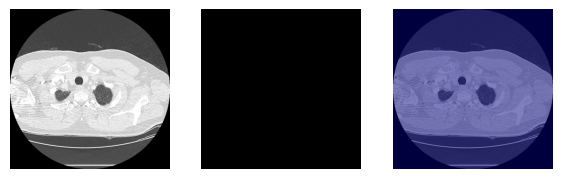

torch.Size([1, 512, 512]) tensor(0.) tensor(1.) torch.float32
torch.Size([512, 512]) tensor(0.) tensor(0.) torch.float32


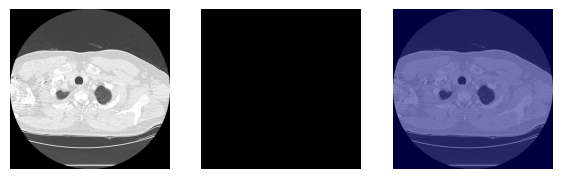

torch.Size([1, 512, 512]) tensor(0.) tensor(1.) torch.float32
torch.Size([512, 512]) tensor(0.) tensor(0.) torch.float32


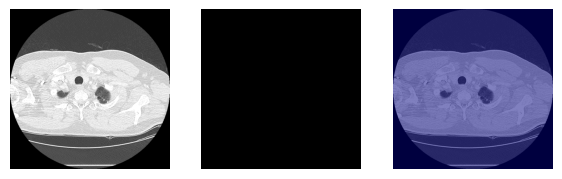

torch.Size([1, 512, 512]) tensor(0.) tensor(1.) torch.float32
torch.Size([512, 512]) tensor(0.) tensor(0.) torch.float32


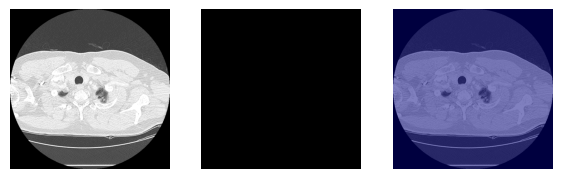

torch.Size([1, 512, 512]) tensor(0.) tensor(1.) torch.float32
torch.Size([512, 512]) tensor(0.) tensor(0.) torch.float32


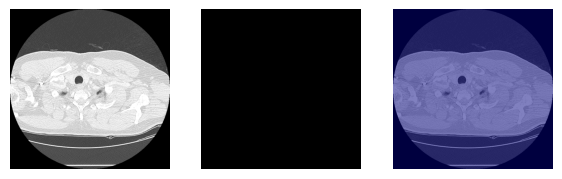

torch.Size([1, 512, 512]) tensor(0.) tensor(1.) torch.float32
torch.Size([512, 512]) tensor(0.) tensor(0.) torch.float32


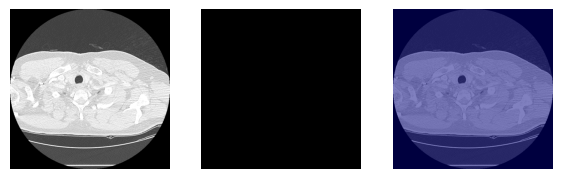

torch.Size([1, 512, 512]) tensor(0.) tensor(1.) torch.float32
torch.Size([512, 512]) tensor(0.) tensor(0.) torch.float32


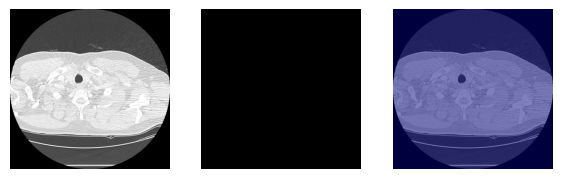

torch.Size([1, 512, 512]) tensor(0.) tensor(1.) torch.float32
torch.Size([512, 512]) tensor(0.) tensor(0.) torch.float32


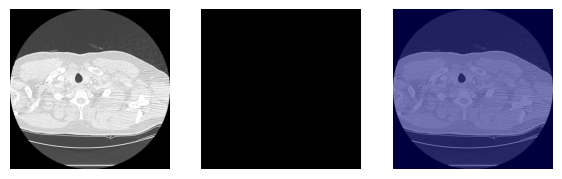

torch.Size([1, 512, 512]) tensor(0.) tensor(1.) torch.float32
torch.Size([512, 512]) tensor(0.) tensor(0.) torch.float32


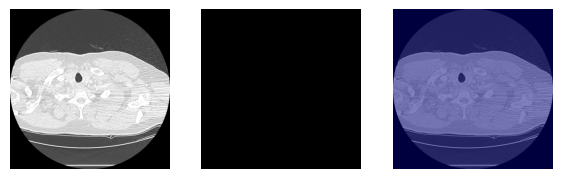

torch.Size([1, 512, 512]) tensor(0.) tensor(1.) torch.float32
torch.Size([512, 512]) tensor(0.) tensor(0.) torch.float32


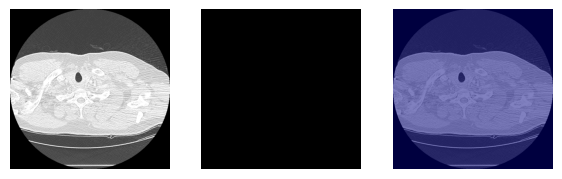

torch.Size([1, 512, 512]) tensor(0.) tensor(1.) torch.float32
torch.Size([512, 512]) tensor(0.) tensor(0.) torch.float32


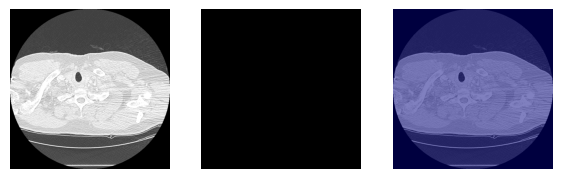

torch.Size([1, 512, 512]) tensor(0.) tensor(1.) torch.float32
torch.Size([512, 512]) tensor(0.) tensor(0.) torch.float32


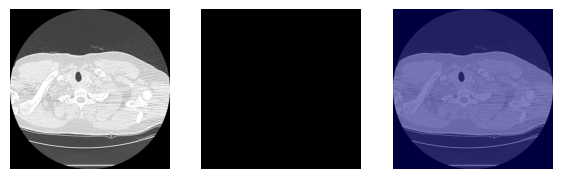

torch.Size([1, 512, 512]) tensor(0.) tensor(1.) torch.float32
torch.Size([512, 512]) tensor(0.) tensor(0.) torch.float32


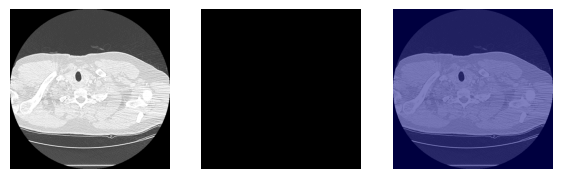

In [9]:
for idx in range(420,440):
    sample = train_dataset[idx]
    sam_img = sample['image']
    sam_mask = sample['mask']

    print(sam_img.shape, sam_img.min(), sam_img.max(), sam_img.dtype)
    print(sam_mask.shape, sam_mask.min(), sam_mask.max(), sam_mask.dtype)

    plt.figure(figsize=(7,7))
    plt.subplot(131)
    plt.imshow(sam_img[0,...], cmap='gray')
    plt.axis('off')
    plt.subplot(132)
    plt.imshow(sam_mask, cmap='gray')
    plt.axis('off')
    plt.subplot(133)
    plt.imshow(sam_img[0,...], cmap='gray')
    plt.imshow(sam_mask, cmap='jet', alpha=.5)
    plt.axis('off')
    plt.show()

In [10]:
model = model_torch.Unet(
    encoder_name='efficientnet-b1',
    encoder_depth=5,
    encoder_weights=None,
    in_channels=1, 
    classes=1,
    activation=None,
    )

model = model.to(device)

In [11]:
optim = torch.optim.Adam(params=model.parameters(),lr = h_params.lr)
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optim,patience=h_params.lr_schedule_patience)

criterion_dice = loss.DiceLoss(mode='binary', smooth=1e-07)
criterion_focal = loss.FocalLoss(mode='binary')

monitor = EarlyStopping(patience=h_params.earlystop_patience,
                        verbose=True,
                        delta=0,
                        path=h_params.model_name,
                        trace_func=print)

In [12]:
def train_show(image,target,pred):
    plt.figure(figsize=(8,8))
    plt.subplot(131)
    plt.imshow(image.cpu().detach().numpy()[0,0,...], cmap='gray')
    plt.axis('off')
    plt.subplot(132)
    plt.imshow(image.cpu().detach().numpy()[0,0,...], cmap='gray')
    plt.imshow(target.cpu().detach().numpy()[0,...], cmap='jet', alpha=.5)
    plt.axis('off')
    plt.subplot(133)
    plt.imshow(image.cpu().detach().numpy()[0,0,...], cmap='gray')
    plt.imshow(pred.cpu().detach().numpy()[0,0,...], cmap='jet', alpha=.5)
    plt.axis('off')
    plt.show()

Train:   0%|          | 0/285 [00:00<?, ?it/s]

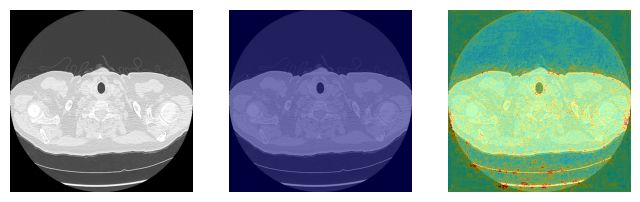

Validation loss decreased (inf --> 0.858540).  Saving model ...
Epoch 001/300	LR: 1e-03
          Train_loss: 0.8585398	Train_dice_loss-> 0.8435256826146779


Train:   0%|          | 0/285 [00:00<?, ?it/s]

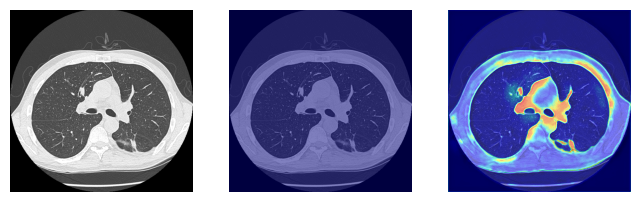

Validation loss decreased (0.858540 --> 0.842101).  Saving model ...
Epoch 002/300	LR: 1e-03
          Train_loss: 0.8421007	Train_dice_loss-> 0.8369234933535677


Train:   0%|          | 0/285 [00:00<?, ?it/s]

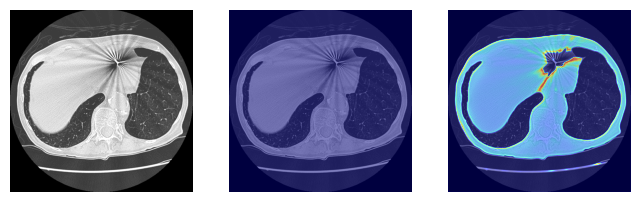

Validation loss decreased (0.842101 --> 0.766335).  Saving model ...
Epoch 003/300	LR: 1e-03
          Train_loss: 0.7663348	Train_dice_loss-> 0.7588011932304942


Train:   0%|          | 0/285 [00:00<?, ?it/s]

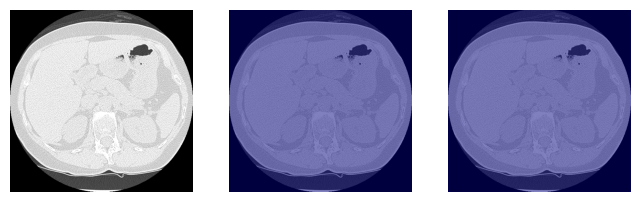

Validation loss decreased (0.766335 --> 0.520350).  Saving model ...
Epoch 004/300	LR: 1e-03
          Train_loss: 0.5203497	Train_dice_loss-> 0.5134832814247418


Train:   0%|          | 0/285 [00:00<?, ?it/s]

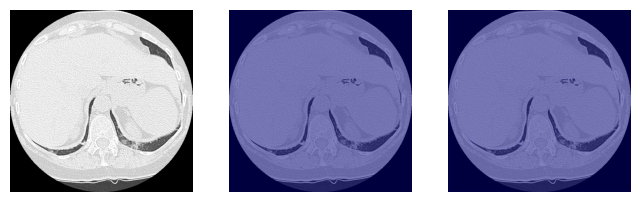

Validation loss decreased (0.520350 --> 0.403469).  Saving model ...
Epoch 005/300	LR: 1e-03
          Train_loss: 0.4034685	Train_dice_loss-> 0.3979536499251012


Train:   0%|          | 0/285 [00:00<?, ?it/s]

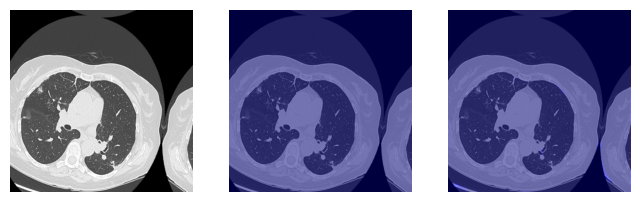

Validation loss decreased (0.403469 --> 0.331358).  Saving model ...
Epoch 006/300	LR: 1e-03
          Train_loss: 0.3313580	Train_dice_loss-> 0.3272426874002135


Train:   0%|          | 0/285 [00:00<?, ?it/s]

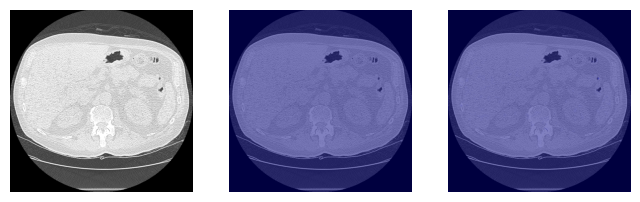

EarlyStopping counter: 1 out of 20
Epoch 007/300	LR: 1e-03
          Train_loss: 0.3452787	Train_dice_loss-> 0.3403894785890682


Train:   0%|          | 0/285 [00:00<?, ?it/s]

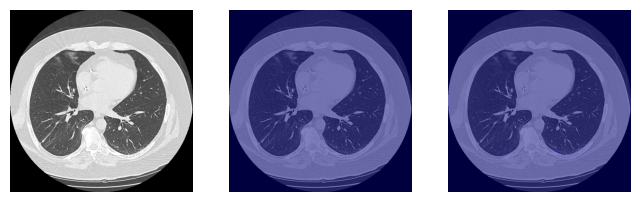

Validation loss decreased (0.331358 --> 0.305440).  Saving model ...
Epoch 008/300	LR: 1e-03
          Train_loss: 0.3054402	Train_dice_loss-> 0.3014941090831283


Train:   0%|          | 0/285 [00:00<?, ?it/s]

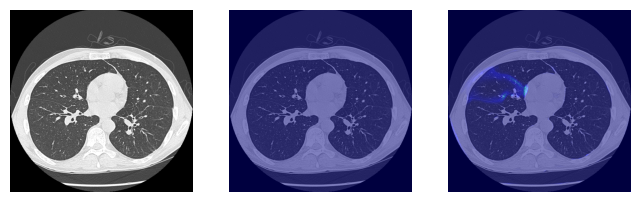

Validation loss decreased (0.305440 --> 0.287440).  Saving model ...
Epoch 009/300	LR: 1e-03
          Train_loss: 0.2874403	Train_dice_loss-> 0.2833114585046636


Train:   0%|          | 0/285 [00:00<?, ?it/s]

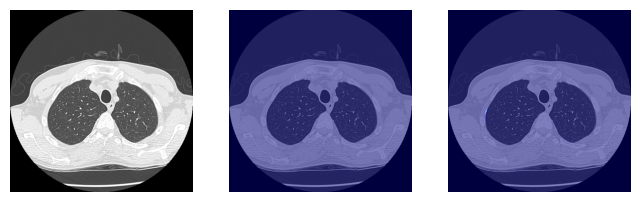

EarlyStopping counter: 1 out of 20
Epoch 010/300	LR: 1e-03
          Train_loss: 0.3381989	Train_dice_loss-> 0.3344035394714052


Train:   0%|          | 0/285 [00:00<?, ?it/s]

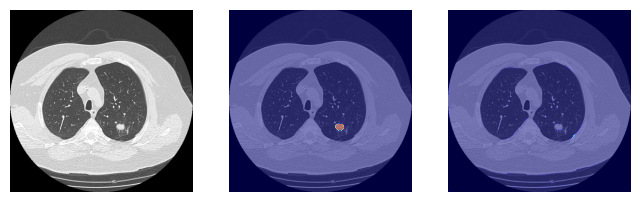

Validation loss decreased (0.287440 --> 0.262853).  Saving model ...
Epoch 011/300	LR: 1e-03
          Train_loss: 0.2628533	Train_dice_loss-> 0.2596898533385865


Train:   0%|          | 0/285 [00:00<?, ?it/s]

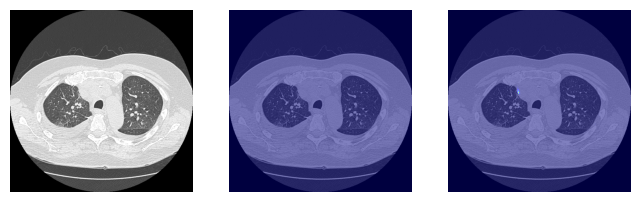

Validation loss decreased (0.262853 --> 0.257508).  Saving model ...
Epoch 012/300	LR: 1e-03
          Train_loss: 0.2575081	Train_dice_loss-> 0.2544522556832166


Train:   0%|          | 0/285 [00:00<?, ?it/s]

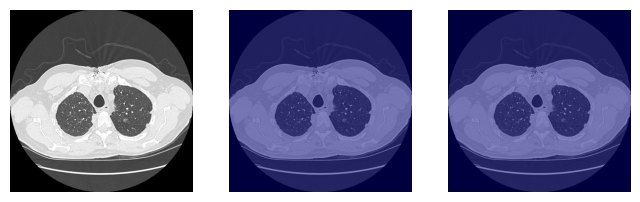

Validation loss decreased (0.257508 --> 0.238192).  Saving model ...
Epoch 013/300	LR: 1e-03
          Train_loss: 0.2381924	Train_dice_loss-> 0.23539206442584626


Train:   0%|          | 0/285 [00:00<?, ?it/s]

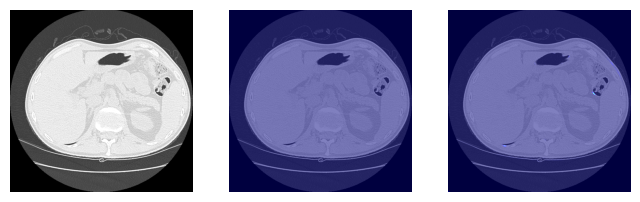

EarlyStopping counter: 1 out of 20
Epoch 014/300	LR: 1e-03
          Train_loss: 0.2566954	Train_dice_loss-> 0.25375199323170944


Train:   0%|          | 0/285 [00:00<?, ?it/s]

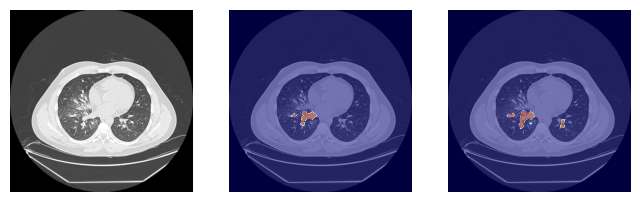

Validation loss decreased (0.238192 --> 0.225115).  Saving model ...
Epoch 015/300	LR: 1e-03
          Train_loss: 0.2251152	Train_dice_loss-> 0.2223162216240169


Train:   0%|          | 0/285 [00:00<?, ?it/s]

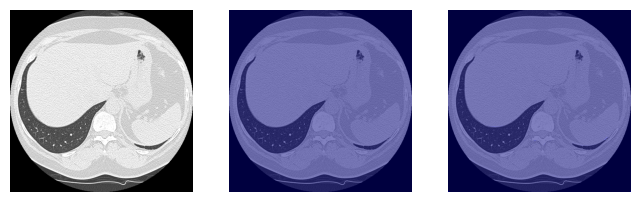

Validation loss decreased (0.225115 --> 0.201689).  Saving model ...
Epoch 016/300	LR: 1e-03
          Train_loss: 0.2016885	Train_dice_loss-> 0.19916214055738404


Train:   0%|          | 0/285 [00:00<?, ?it/s]

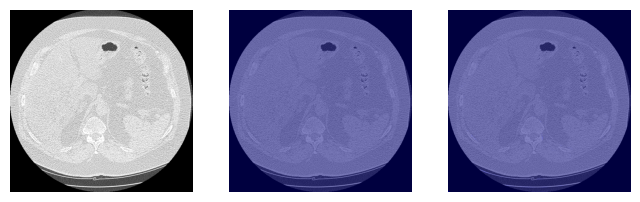

EarlyStopping counter: 1 out of 20
Epoch 017/300	LR: 1e-03
          Train_loss: 0.2807153	Train_dice_loss-> 0.2748456454963324


Train:   0%|          | 0/285 [00:00<?, ?it/s]

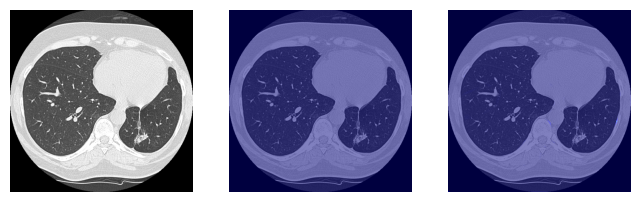

EarlyStopping counter: 2 out of 20
Epoch 018/300	LR: 1e-03
          Train_loss: 0.2407093	Train_dice_loss-> 0.23796474852422597


Train:   0%|          | 0/285 [00:00<?, ?it/s]

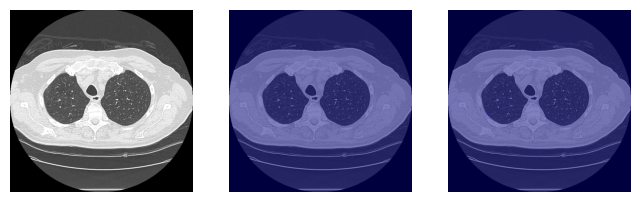

EarlyStopping counter: 3 out of 20
Epoch 019/300	LR: 1e-03
          Train_loss: 0.2262484	Train_dice_loss-> 0.2240378946242713


Train:   0%|          | 0/285 [00:00<?, ?it/s]

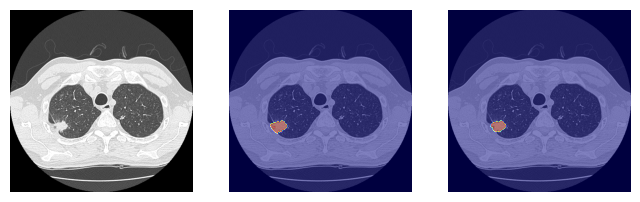

EarlyStopping counter: 4 out of 20
Epoch 020/300	LR: 1e-03
          Train_loss: 0.2029661	Train_dice_loss-> 0.2005409281925955


Train:   0%|          | 0/285 [00:00<?, ?it/s]

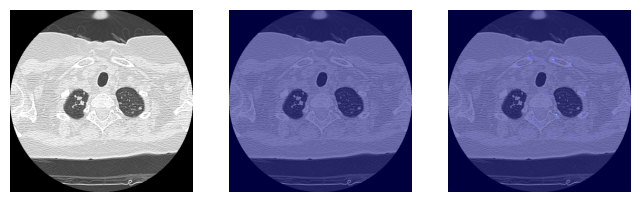

EarlyStopping counter: 5 out of 20
Epoch 021/300	LR: 1e-03
          Train_loss: 0.2130510	Train_dice_loss-> 0.21093182434382948


Train:   0%|          | 0/285 [00:00<?, ?it/s]

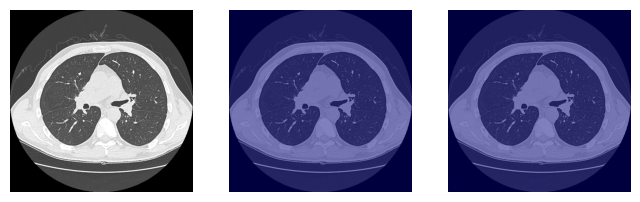

EarlyStopping counter: 6 out of 20
Epoch 022/300	LR: 1e-03
          Train_loss: 0.2077072	Train_dice_loss-> 0.20536294912825676


Train:   0%|          | 0/285 [00:00<?, ?it/s]

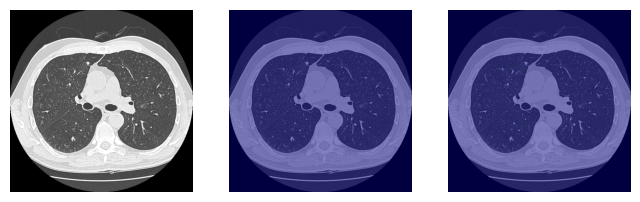

Validation loss decreased (0.201689 --> 0.188498).  Saving model ...
Epoch 023/300	LR: 1e-03
          Train_loss: 0.1884976	Train_dice_loss-> 0.18627060965846276


Train:   0%|          | 0/285 [00:00<?, ?it/s]

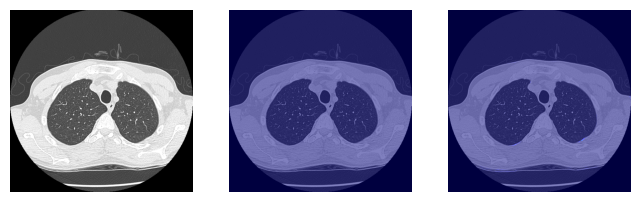

Validation loss decreased (0.188498 --> 0.170714).  Saving model ...
Epoch 024/300	LR: 1e-03
          Train_loss: 0.1707137	Train_dice_loss-> 0.16860654073294848


Train:   0%|          | 0/285 [00:00<?, ?it/s]

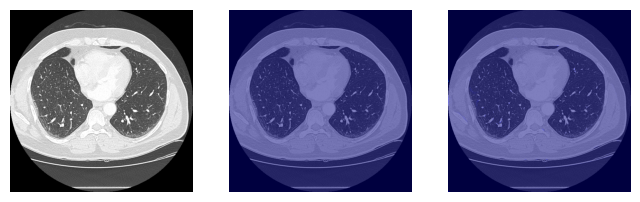

EarlyStopping counter: 1 out of 20
Epoch 025/300	LR: 1e-03
          Train_loss: 0.1787663	Train_dice_loss-> 0.17665251331836462


Train:   0%|          | 0/285 [00:00<?, ?it/s]

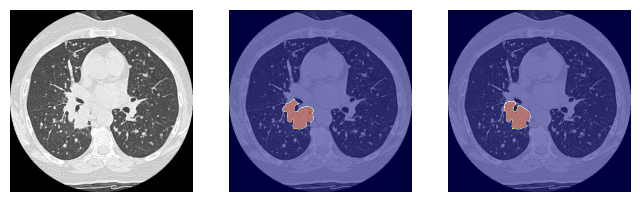

EarlyStopping counter: 2 out of 20
Epoch 026/300	LR: 1e-03
          Train_loss: 0.1985084	Train_dice_loss-> 0.19618208773501283


Train:   0%|          | 0/285 [00:00<?, ?it/s]

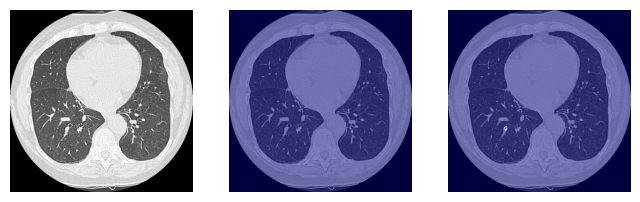

EarlyStopping counter: 3 out of 20
Epoch 027/300	LR: 1e-03
          Train_loss: 0.2121749	Train_dice_loss-> 0.20929900475109942


Train:   0%|          | 0/285 [00:00<?, ?it/s]

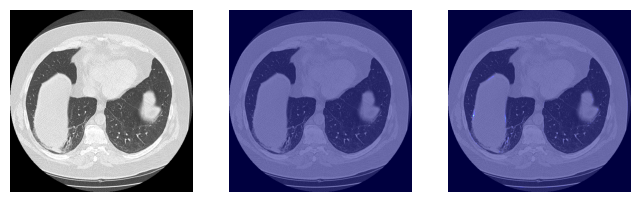

EarlyStopping counter: 4 out of 20
Epoch 028/300	LR: 1e-03
          Train_loss: 0.2008087	Train_dice_loss-> 0.1982344610825708


Train:   0%|          | 0/285 [00:00<?, ?it/s]

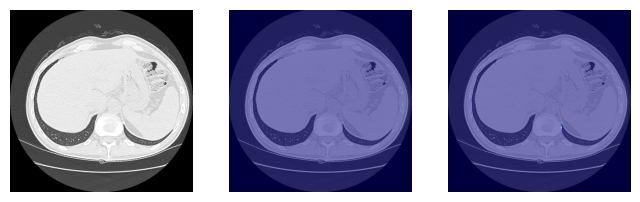

EarlyStopping counter: 5 out of 20
Epoch 029/300	LR: 1e-03
          Train_loss: 0.1819249	Train_dice_loss-> 0.18005146076065764


Train:   0%|          | 0/285 [00:00<?, ?it/s]

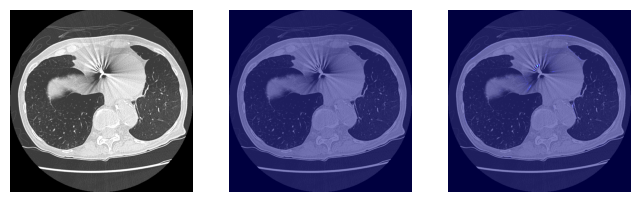

EarlyStopping counter: 6 out of 20
Epoch 030/300	LR: 1e-03
          Train_loss: 0.1820116	Train_dice_loss-> 0.17953061692087605


Train:   0%|          | 0/285 [00:00<?, ?it/s]

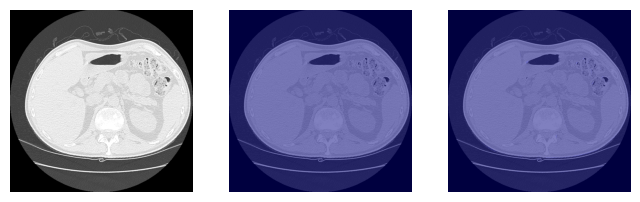

Validation loss decreased (0.170714 --> 0.158978).  Saving model ...
Epoch 031/300	LR: 1e-03
          Train_loss: 0.1589777	Train_dice_loss-> 0.1572323132546177


Train:   0%|          | 0/285 [00:00<?, ?it/s]

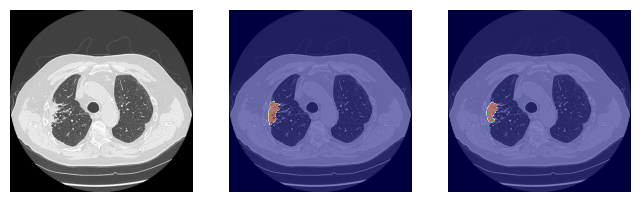

EarlyStopping counter: 1 out of 20
Epoch 032/300	LR: 1e-03
          Train_loss: 0.1627295	Train_dice_loss-> 0.16080013607077953


Train:   0%|          | 0/285 [00:00<?, ?it/s]

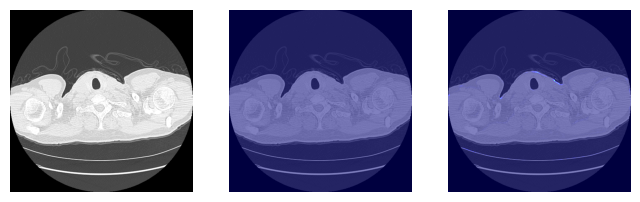

EarlyStopping counter: 2 out of 20
Epoch 033/300	LR: 1e-03
          Train_loss: 0.1907927	Train_dice_loss-> 0.18893858391592672


Train:   0%|          | 0/285 [00:00<?, ?it/s]

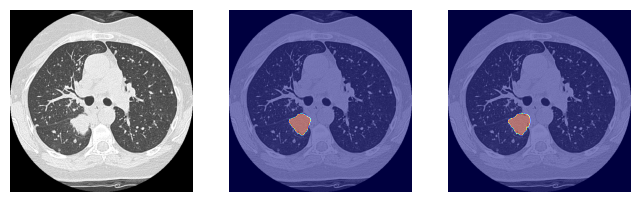

EarlyStopping counter: 3 out of 20
Epoch 034/300	LR: 1e-03
          Train_loss: 0.1833078	Train_dice_loss-> 0.1808513330381222


Train:   0%|          | 0/285 [00:00<?, ?it/s]

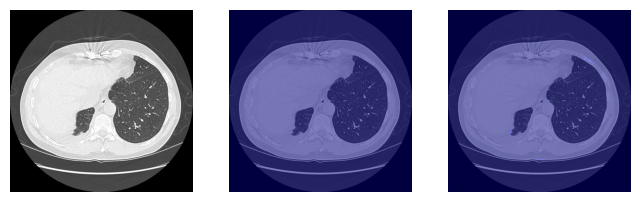

EarlyStopping counter: 4 out of 20
Epoch 035/300	LR: 1e-03
          Train_loss: 0.1985903	Train_dice_loss-> 0.19605204666664092


Train:   0%|          | 0/285 [00:00<?, ?it/s]

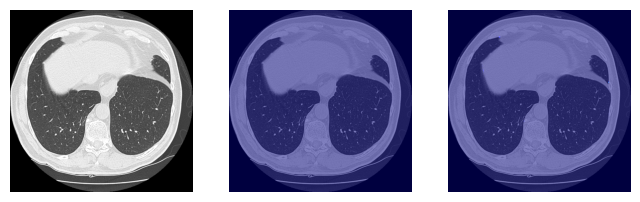

EarlyStopping counter: 5 out of 20
Epoch 036/300	LR: 1e-03
          Train_loss: 0.2219923	Train_dice_loss-> 0.21924692320315503


Train:   0%|          | 0/285 [00:00<?, ?it/s]

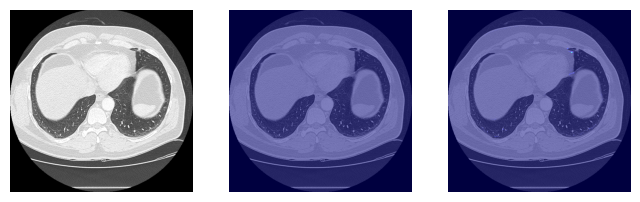

EarlyStopping counter: 6 out of 20
Epoch 037/300	LR: 1e-03
          Train_loss: 0.1976658	Train_dice_loss-> 0.19540614071743118


Train:   0%|          | 0/285 [00:00<?, ?it/s]

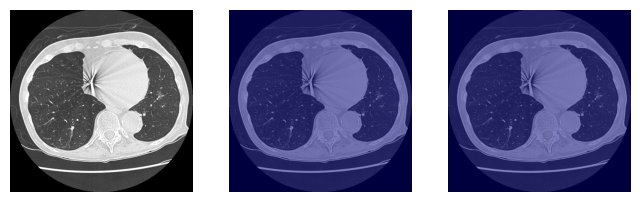

Validation loss decreased (0.158978 --> 0.149383).  Saving model ...
Epoch 038/300	LR: 1e-03
          Train_loss: 0.1493829	Train_dice_loss-> 0.14747271436147705


Train:   0%|          | 0/285 [00:00<?, ?it/s]

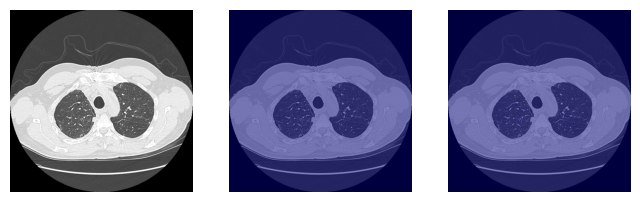

EarlyStopping counter: 1 out of 20
Epoch 039/300	LR: 1e-03
          Train_loss: 0.1846202	Train_dice_loss-> 0.1821406497925985


Train:   0%|          | 0/285 [00:00<?, ?it/s]

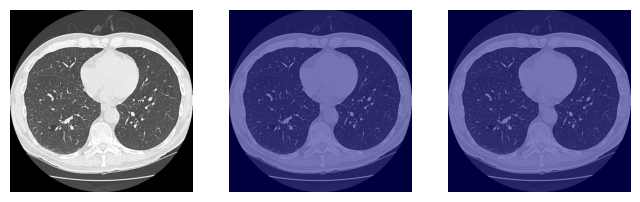

EarlyStopping counter: 2 out of 20
Epoch 040/300	LR: 1e-03
          Train_loss: 0.1797462	Train_dice_loss-> 0.17804061761402187


Train:   0%|          | 0/285 [00:00<?, ?it/s]

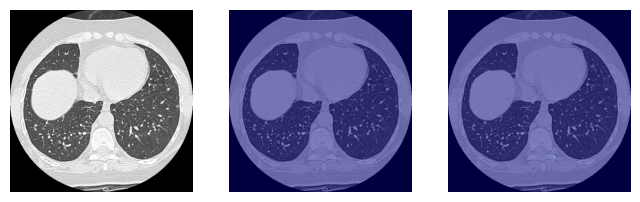

EarlyStopping counter: 3 out of 20
Epoch 041/300	LR: 1e-03
          Train_loss: 0.1535709	Train_dice_loss-> 0.1517877473959004


Train:   0%|          | 0/285 [00:00<?, ?it/s]

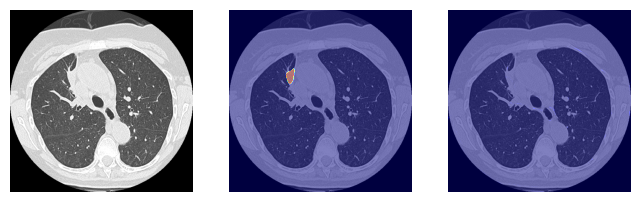

EarlyStopping counter: 4 out of 20
Epoch 042/300	LR: 1e-03
          Train_loss: 0.2276728	Train_dice_loss-> 0.22399220626921582


Train:   0%|          | 0/285 [00:00<?, ?it/s]

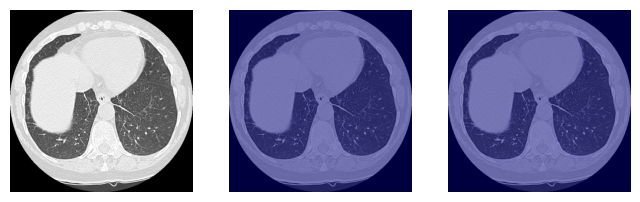

EarlyStopping counter: 5 out of 20
Epoch 043/300	LR: 1e-03
          Train_loss: 0.1929923	Train_dice_loss-> 0.18919513996185458


Train:   0%|          | 0/285 [00:00<?, ?it/s]

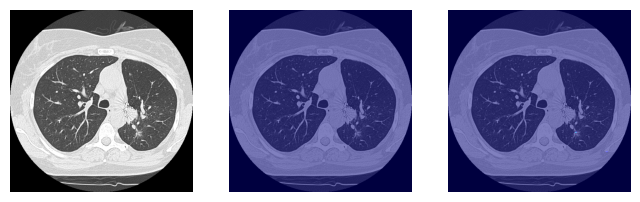

EarlyStopping counter: 6 out of 20
Epoch 044/300	LR: 1e-03
          Train_loss: 0.1742199	Train_dice_loss-> 0.17206225964138205


Train:   0%|          | 0/285 [00:00<?, ?it/s]

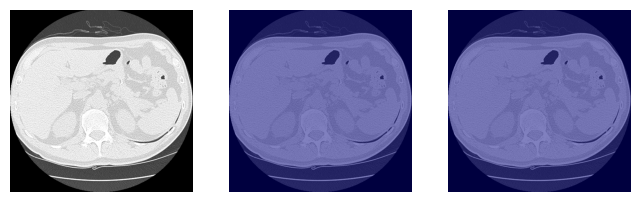

EarlyStopping counter: 7 out of 20
Epoch 045/300	LR: 1e-03
          Train_loss: 0.1513152	Train_dice_loss-> 0.14922643780472566


Train:   0%|          | 0/285 [00:00<?, ?it/s]

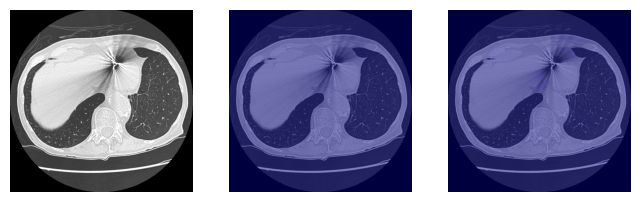

Validation loss decreased (0.149383 --> 0.146403).  Saving model ...
Epoch 046/300	LR: 1e-03
          Train_loss: 0.1464032	Train_dice_loss-> 0.1446489674839128


Train:   0%|          | 0/285 [00:00<?, ?it/s]

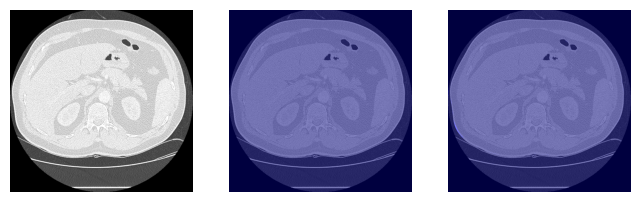

EarlyStopping counter: 1 out of 20
Epoch 047/300	LR: 1e-03
          Train_loss: 0.1760582	Train_dice_loss-> 0.17343865263936178


Train:   0%|          | 0/285 [00:00<?, ?it/s]

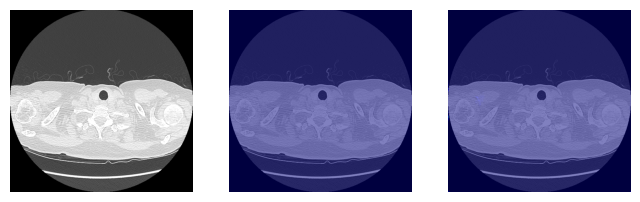

Validation loss decreased (0.146403 --> 0.143199).  Saving model ...
Epoch 048/300	LR: 1e-03
          Train_loss: 0.1431992	Train_dice_loss-> 0.14141692820027016


Train:   0%|          | 0/285 [00:00<?, ?it/s]

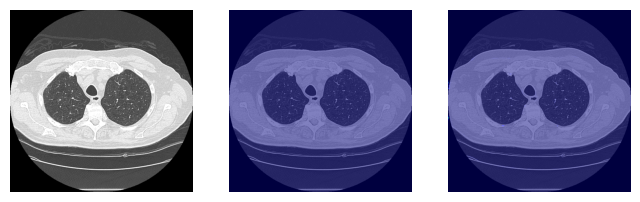

Validation loss decreased (0.143199 --> 0.136837).  Saving model ...
Epoch 049/300	LR: 1e-03
          Train_loss: 0.1368371	Train_dice_loss-> 0.13538271099676066


Train:   0%|          | 0/285 [00:00<?, ?it/s]

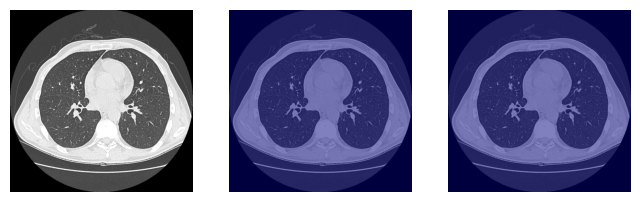

Validation loss decreased (0.136837 --> 0.127409).  Saving model ...
Epoch 050/300	LR: 1e-03
          Train_loss: 0.1274086	Train_dice_loss-> 0.12591321492975713


Train:   0%|          | 0/285 [00:00<?, ?it/s]

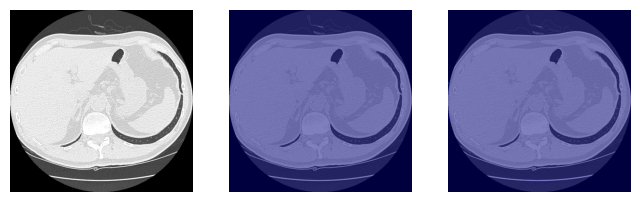

EarlyStopping counter: 1 out of 20
Epoch 051/300	LR: 1e-03
          Train_loss: 0.1600634	Train_dice_loss-> 0.15843798348836075


Train:   0%|          | 0/285 [00:00<?, ?it/s]

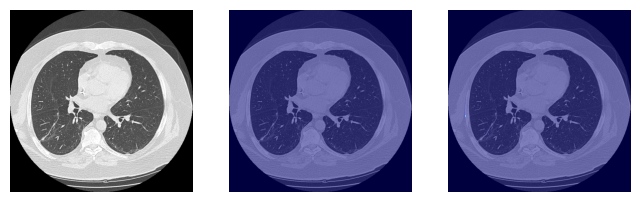

EarlyStopping counter: 2 out of 20
Epoch 052/300	LR: 1e-03
          Train_loss: 0.1871238	Train_dice_loss-> 0.183959174342167


Train:   0%|          | 0/285 [00:00<?, ?it/s]

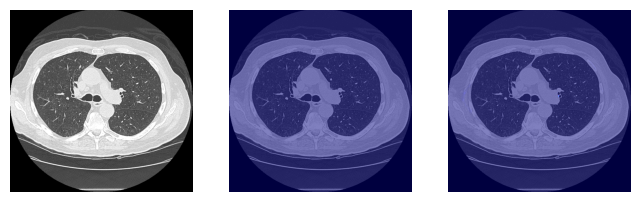

EarlyStopping counter: 3 out of 20
Epoch 053/300	LR: 1e-03
          Train_loss: 0.1556178	Train_dice_loss-> 0.15374771091236542


Train:   0%|          | 0/285 [00:00<?, ?it/s]

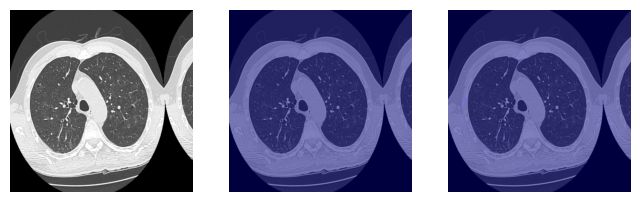

EarlyStopping counter: 4 out of 20
Epoch 054/300	LR: 1e-03
          Train_loss: 0.1448721	Train_dice_loss-> 0.14316578410112368


Train:   0%|          | 0/285 [00:00<?, ?it/s]

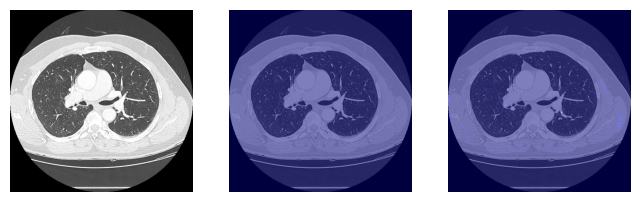

EarlyStopping counter: 5 out of 20
Epoch 055/300	LR: 1e-03
          Train_loss: 0.1364000	Train_dice_loss-> 0.13458047199186401


Train:   0%|          | 0/285 [00:00<?, ?it/s]

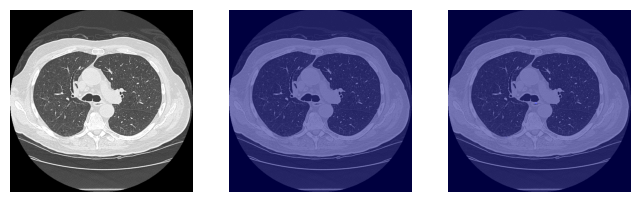

EarlyStopping counter: 6 out of 20
Epoch 056/300	LR: 1e-03
          Train_loss: 0.1376164	Train_dice_loss-> 0.1358565468495821


Train:   0%|          | 0/285 [00:00<?, ?it/s]

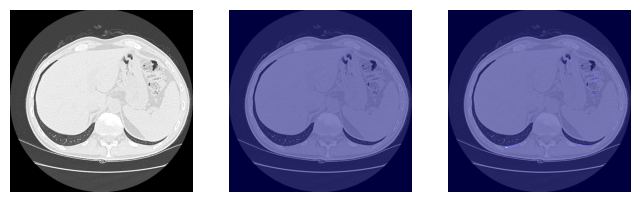

Validation loss decreased (0.127409 --> 0.120097).  Saving model ...
Epoch 057/300	LR: 1e-03
          Train_loss: 0.1200969	Train_dice_loss-> 0.11865477707589807


Train:   0%|          | 0/285 [00:00<?, ?it/s]

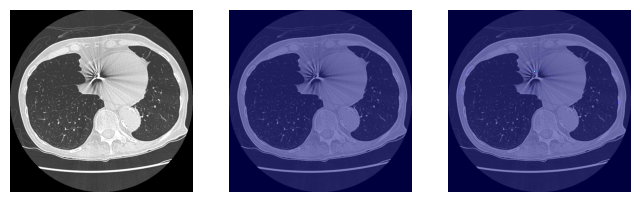

EarlyStopping counter: 1 out of 20
Epoch 058/300	LR: 1e-03
          Train_loss: 0.1573038	Train_dice_loss-> 0.15503405372118378


Train:   0%|          | 0/285 [00:00<?, ?it/s]

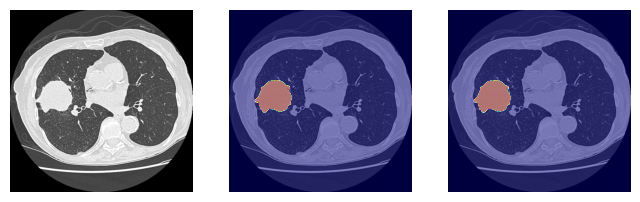

EarlyStopping counter: 2 out of 20
Epoch 059/300	LR: 1e-03
          Train_loss: 0.1421427	Train_dice_loss-> 0.1405210281251368


Train:   0%|          | 0/285 [00:00<?, ?it/s]

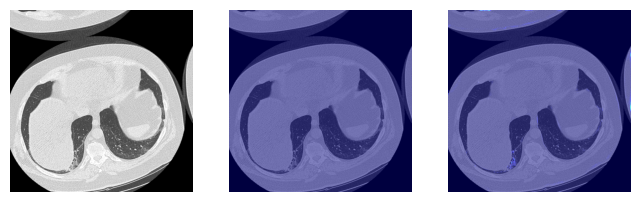

EarlyStopping counter: 3 out of 20
Epoch 060/300	LR: 1e-03
          Train_loss: 0.1223748	Train_dice_loss-> 0.12097864039938049


Train:   0%|          | 0/285 [00:00<?, ?it/s]

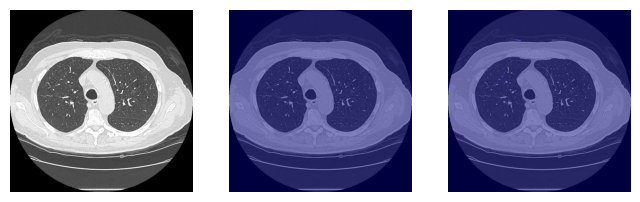

EarlyStopping counter: 4 out of 20
Epoch 061/300	LR: 1e-03
          Train_loss: 0.1372287	Train_dice_loss-> 0.1356475144997976


Train:   0%|          | 0/285 [00:00<?, ?it/s]

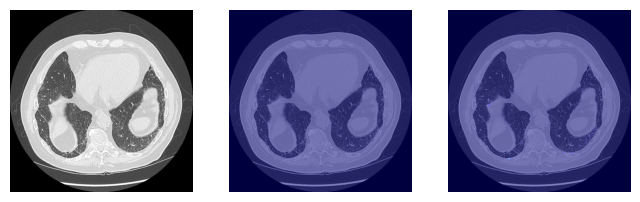

EarlyStopping counter: 5 out of 20
Epoch 062/300	LR: 1e-03
          Train_loss: 0.1496853	Train_dice_loss-> 0.1476384909093786


Train:   0%|          | 0/285 [00:00<?, ?it/s]

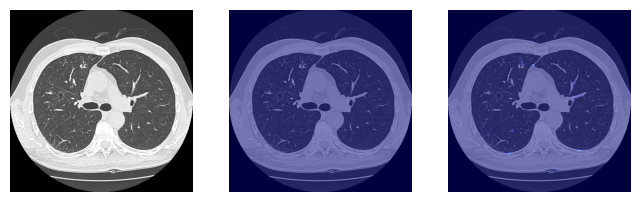

EarlyStopping counter: 6 out of 20
Epoch 063/300	LR: 1e-03
          Train_loss: 0.1437733	Train_dice_loss-> 0.14201590880486395


Train:   0%|          | 0/285 [00:00<?, ?it/s]

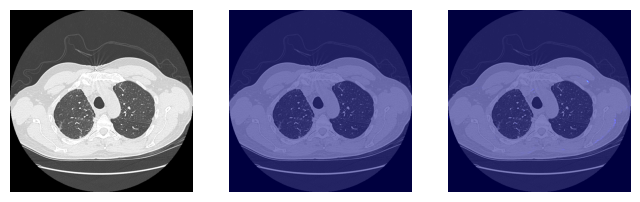

Validation loss decreased (0.120097 --> 0.116108).  Saving model ...
Epoch 064/300	LR: 1e-03
          Train_loss: 0.1161078	Train_dice_loss-> 0.11481420172882248


Train:   0%|          | 0/285 [00:00<?, ?it/s]

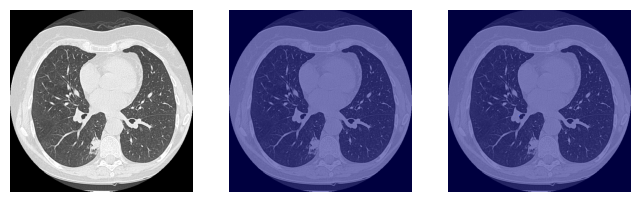

EarlyStopping counter: 1 out of 20
Epoch 065/300	LR: 1e-03
          Train_loss: 0.1183710	Train_dice_loss-> 0.11684390901864374


Train:   0%|          | 0/285 [00:00<?, ?it/s]

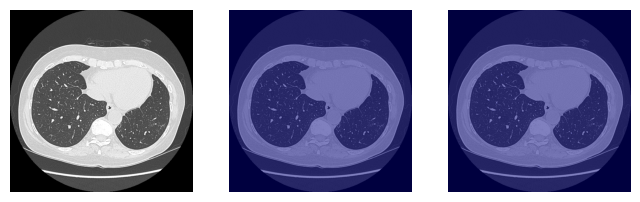

Validation loss decreased (0.116108 --> 0.107299).  Saving model ...
Epoch 066/300	LR: 1e-03
          Train_loss: 0.1072988	Train_dice_loss-> 0.10604728098571549


Train:   0%|          | 0/285 [00:00<?, ?it/s]

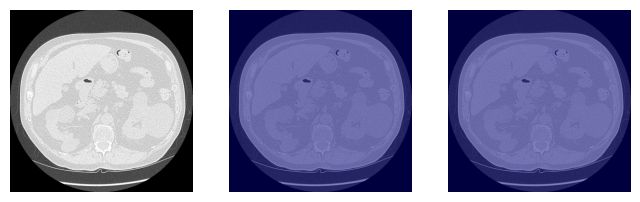

EarlyStopping counter: 1 out of 20
Epoch 067/300	LR: 1e-03
          Train_loss: 0.1400017	Train_dice_loss-> 0.13839481658030278


Train:   0%|          | 0/285 [00:00<?, ?it/s]

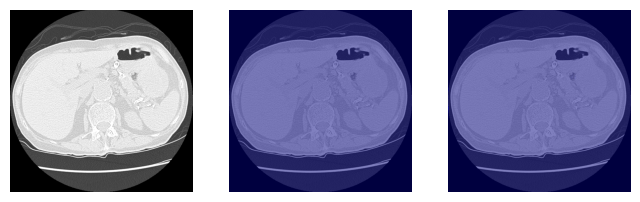

EarlyStopping counter: 2 out of 20
Epoch 068/300	LR: 1e-03
          Train_loss: 0.1402000	Train_dice_loss-> 0.13809252847448544


Train:   0%|          | 0/285 [00:00<?, ?it/s]

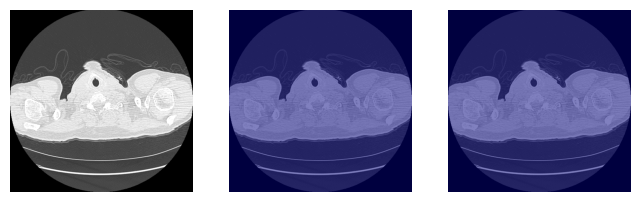

EarlyStopping counter: 3 out of 20
Epoch 069/300	LR: 1e-03
          Train_loss: 0.1077218	Train_dice_loss-> 0.10642128099690058


Train:   0%|          | 0/285 [00:00<?, ?it/s]

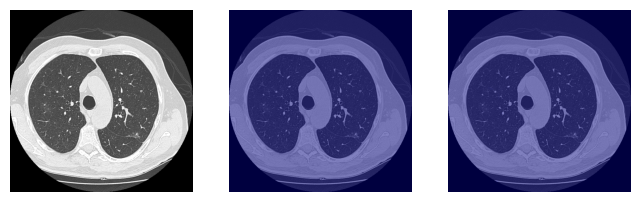

EarlyStopping counter: 4 out of 20
Epoch 070/300	LR: 1e-03
          Train_loss: 0.1183678	Train_dice_loss-> 0.1168117669880246


Train:   0%|          | 0/285 [00:00<?, ?it/s]

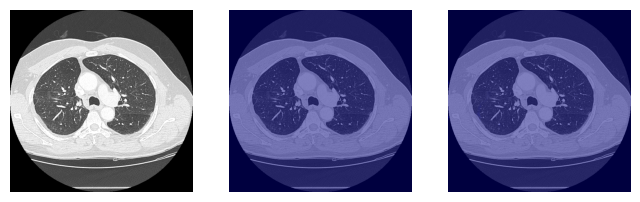

EarlyStopping counter: 5 out of 20
Epoch 071/300	LR: 1e-03
          Train_loss: 0.1222761	Train_dice_loss-> 0.12097409875071774


Train:   0%|          | 0/285 [00:00<?, ?it/s]

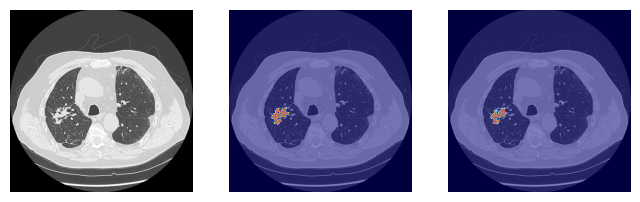

EarlyStopping counter: 6 out of 20
Epoch 072/300	LR: 1e-03
          Train_loss: 0.1104894	Train_dice_loss-> 0.1091266718834894


Train:   0%|          | 0/285 [00:00<?, ?it/s]

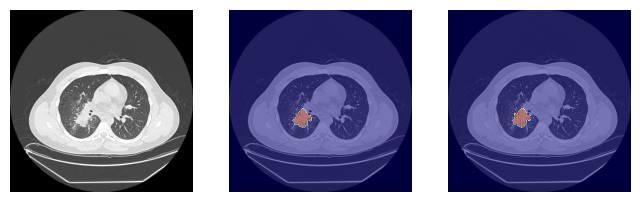

EarlyStopping counter: 7 out of 20
Epoch 073/300	LR: 1e-03
          Train_loss: 0.1450661	Train_dice_loss-> 0.14309186941711385


Train:   0%|          | 0/285 [00:00<?, ?it/s]

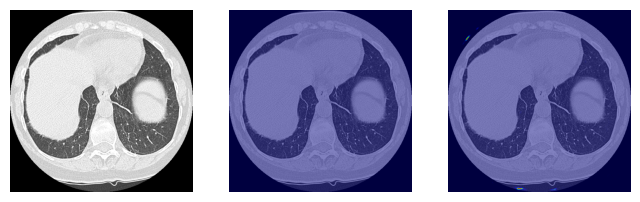

EarlyStopping counter: 8 out of 20
Epoch 074/300	LR: 1e-03
          Train_loss: 0.1213668	Train_dice_loss-> 0.1199202926256871


Train:   0%|          | 0/285 [00:00<?, ?it/s]

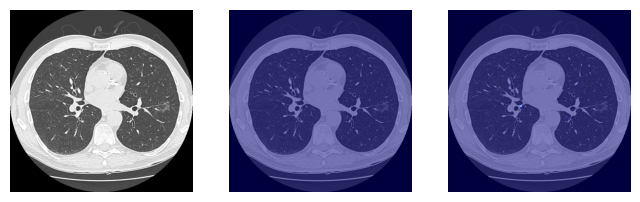

EarlyStopping counter: 9 out of 20
Epoch 075/300	LR: 1e-04
          Train_loss: 0.1157877	Train_dice_loss-> 0.11444797571662546


Train:   0%|          | 0/285 [00:00<?, ?it/s]

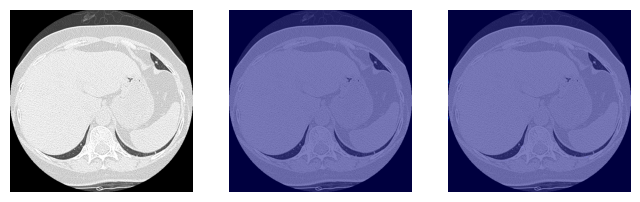

EarlyStopping counter: 10 out of 20
Epoch 076/300	LR: 1e-04
          Train_loss: 0.1126548	Train_dice_loss-> 0.11135183658161889


Train:   0%|          | 0/285 [00:00<?, ?it/s]

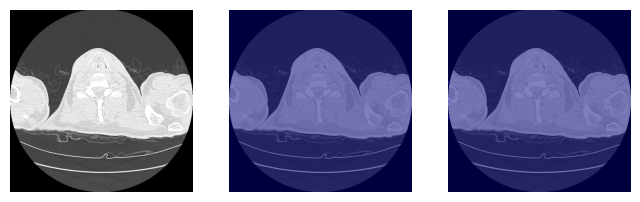

EarlyStopping counter: 11 out of 20
Epoch 077/300	LR: 1e-04
          Train_loss: 0.1176136	Train_dice_loss-> 0.116492998990298


Train:   0%|          | 0/285 [00:00<?, ?it/s]

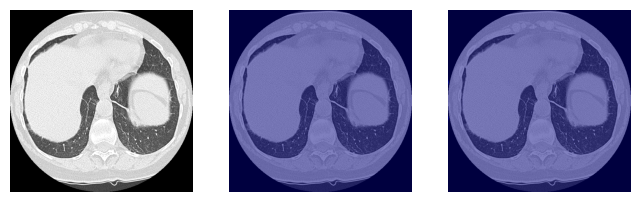

EarlyStopping counter: 12 out of 20
Epoch 078/300	LR: 1e-04
          Train_loss: 0.1139565	Train_dice_loss-> 0.11285978420779774


Train:   0%|          | 0/285 [00:00<?, ?it/s]

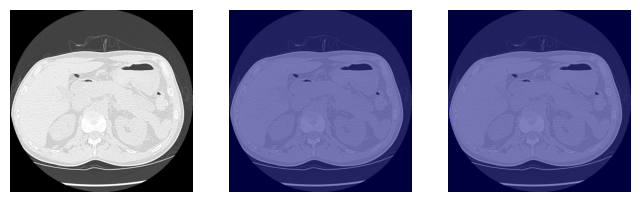

Validation loss decreased (0.107299 --> 0.101108).  Saving model ...
Epoch 079/300	LR: 1e-04
          Train_loss: 0.1011084	Train_dice_loss-> 0.10006494259891917


Train:   0%|          | 0/285 [00:00<?, ?it/s]

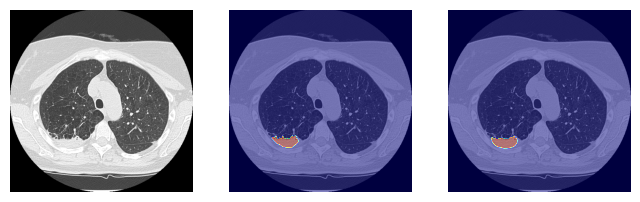

EarlyStopping counter: 1 out of 20
Epoch 080/300	LR: 1e-04
          Train_loss: 0.1178582	Train_dice_loss-> 0.1167777699969465


Train:   0%|          | 0/285 [00:00<?, ?it/s]

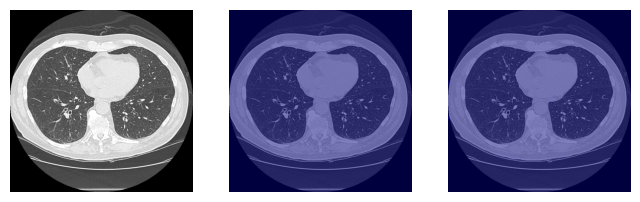

EarlyStopping counter: 2 out of 20
Epoch 081/300	LR: 1e-04
          Train_loss: 0.1042985	Train_dice_loss-> 0.10322164645747178


Train:   0%|          | 0/285 [00:00<?, ?it/s]

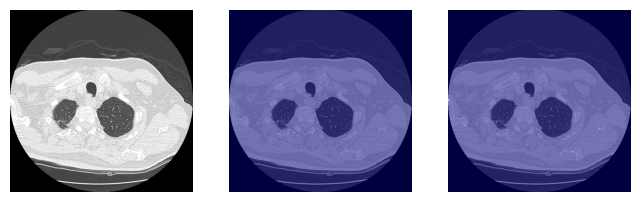

Validation loss decreased (0.101108 --> 0.091059).  Saving model ...
Epoch 082/300	LR: 1e-04
          Train_loss: 0.0910590	Train_dice_loss-> 0.09003989183360522


Train:   0%|          | 0/285 [00:00<?, ?it/s]

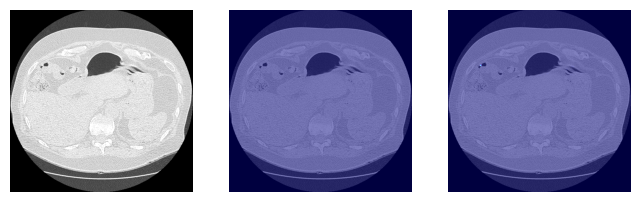

EarlyStopping counter: 1 out of 20
Epoch 083/300	LR: 1e-04
          Train_loss: 0.1012762	Train_dice_loss-> 0.10022286356634896


Train:   0%|          | 0/285 [00:00<?, ?it/s]

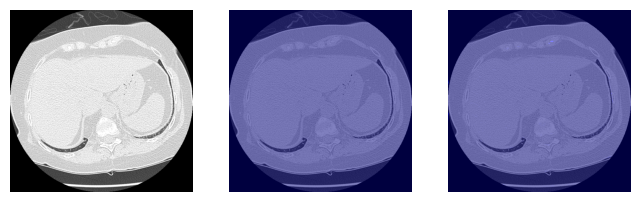

EarlyStopping counter: 2 out of 20
Epoch 084/300	LR: 1e-04
          Train_loss: 0.1085618	Train_dice_loss-> 0.10755766137461954


Train:   0%|          | 0/285 [00:00<?, ?it/s]

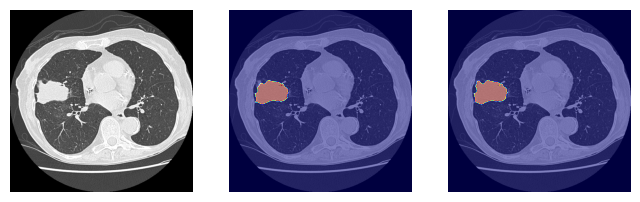

Validation loss decreased (0.091059 --> 0.089178).  Saving model ...
Epoch 085/300	LR: 1e-04
          Train_loss: 0.0891781	Train_dice_loss-> 0.08810766455472839


Train:   0%|          | 0/285 [00:00<?, ?it/s]

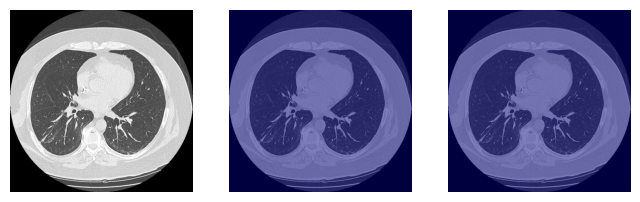

EarlyStopping counter: 1 out of 20
Epoch 086/300	LR: 1e-04
          Train_loss: 0.0928084	Train_dice_loss-> 0.09185936172777048


Train:   0%|          | 0/285 [00:00<?, ?it/s]

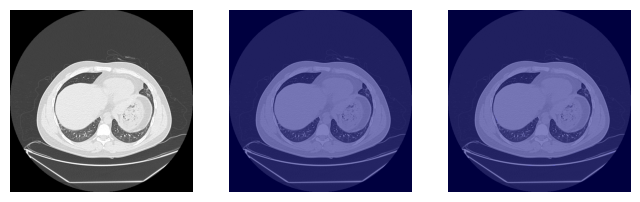

EarlyStopping counter: 2 out of 20
Epoch 087/300	LR: 1e-04
          Train_loss: 0.0916099	Train_dice_loss-> 0.09061216388631983


Train:   0%|          | 0/285 [00:00<?, ?it/s]

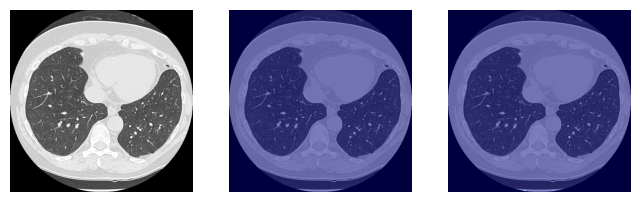

Validation loss decreased (0.089178 --> 0.080069).  Saving model ...
Epoch 088/300	LR: 1e-04
          Train_loss: 0.0800687	Train_dice_loss-> 0.07910023288814819


Train:   0%|          | 0/285 [00:00<?, ?it/s]

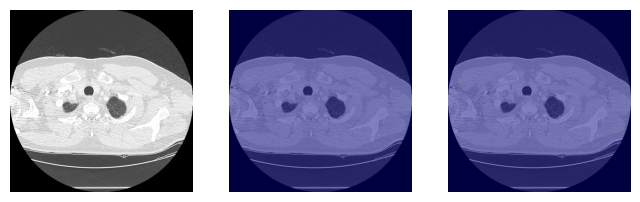

EarlyStopping counter: 1 out of 20
Epoch 089/300	LR: 1e-04
          Train_loss: 0.0891582	Train_dice_loss-> 0.08822694712223732


Train:   0%|          | 0/285 [00:00<?, ?it/s]

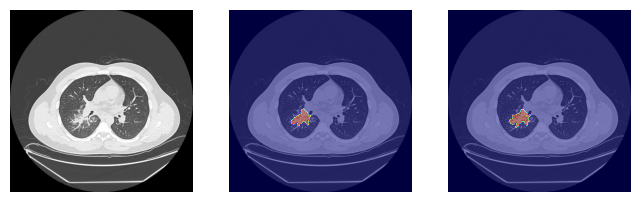

EarlyStopping counter: 2 out of 20
Epoch 090/300	LR: 1e-04
          Train_loss: 0.0887539	Train_dice_loss-> 0.08775261916110501


Train:   0%|          | 0/285 [00:00<?, ?it/s]

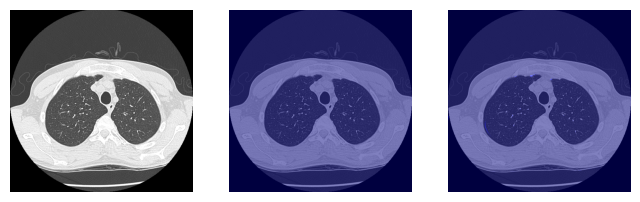

EarlyStopping counter: 3 out of 20
Epoch 091/300	LR: 1e-04
          Train_loss: 0.1192866	Train_dice_loss-> 0.11815727550730394


Train:   0%|          | 0/285 [00:00<?, ?it/s]

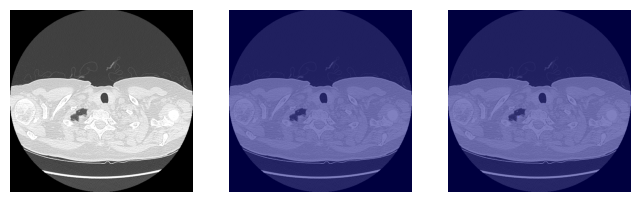

EarlyStopping counter: 4 out of 20
Epoch 092/300	LR: 1e-04
          Train_loss: 0.0884673	Train_dice_loss-> 0.08748836722695626


Train:   0%|          | 0/285 [00:00<?, ?it/s]

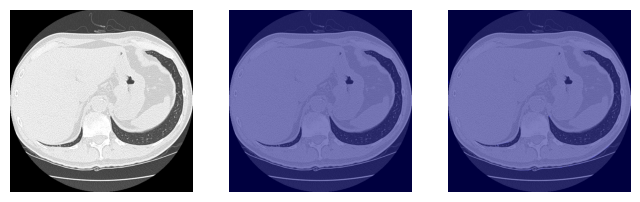

EarlyStopping counter: 5 out of 20
Epoch 093/300	LR: 1e-04
          Train_loss: 0.0899061	Train_dice_loss-> 0.08881925466531608


Train:   0%|          | 0/285 [00:00<?, ?it/s]

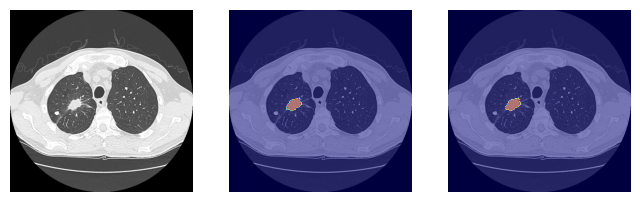

EarlyStopping counter: 6 out of 20
Epoch 094/300	LR: 1e-04
          Train_loss: 0.0971951	Train_dice_loss-> 0.09620719247009958


Train:   0%|          | 0/285 [00:00<?, ?it/s]

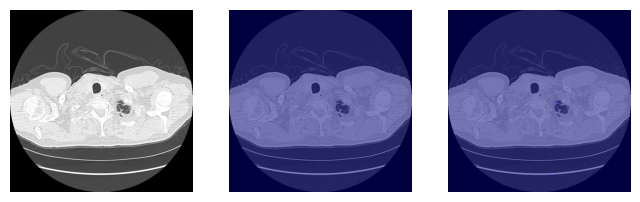

EarlyStopping counter: 7 out of 20
Epoch 095/300	LR: 1e-04
          Train_loss: 0.0838779	Train_dice_loss-> 0.08286106651941516


Train:   0%|          | 0/285 [00:00<?, ?it/s]

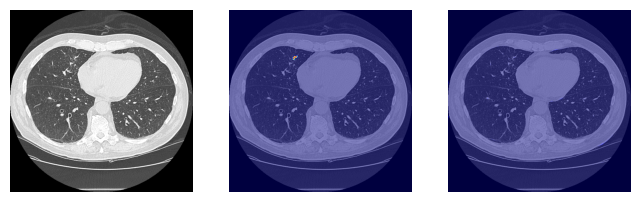

EarlyStopping counter: 8 out of 20
Epoch 096/300	LR: 1e-04
          Train_loss: 0.0829892	Train_dice_loss-> 0.08203600684618378


Train:   0%|          | 0/285 [00:00<?, ?it/s]

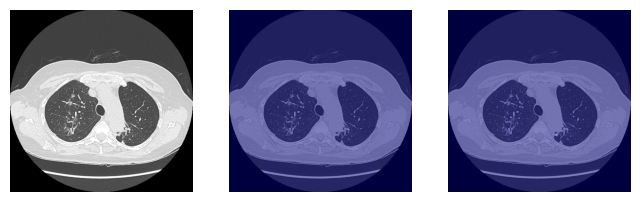

EarlyStopping counter: 9 out of 20
Epoch 097/300	LR: 1e-05
          Train_loss: 0.0840919	Train_dice_loss-> 0.08319992281478517


Train:   0%|          | 0/285 [00:00<?, ?it/s]

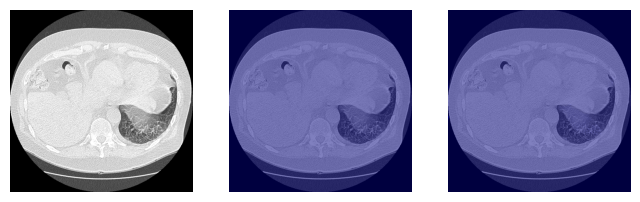

EarlyStopping counter: 10 out of 20
Epoch 098/300	LR: 1e-05
          Train_loss: 0.0985024	Train_dice_loss-> 0.09745087668911961


Train:   0%|          | 0/285 [00:00<?, ?it/s]

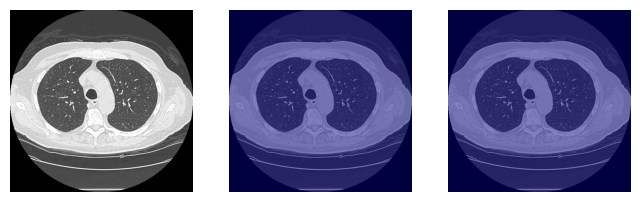

EarlyStopping counter: 11 out of 20
Epoch 099/300	LR: 1e-05
          Train_loss: 0.0980828	Train_dice_loss-> 0.09711997412346504


Train:   0%|          | 0/285 [00:00<?, ?it/s]

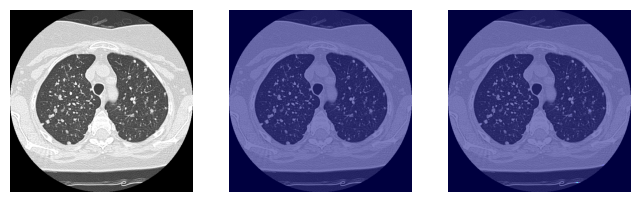

EarlyStopping counter: 12 out of 20
Epoch 100/300	LR: 1e-05
          Train_loss: 0.0803926	Train_dice_loss-> 0.07951414568087369


Train:   0%|          | 0/285 [00:00<?, ?it/s]

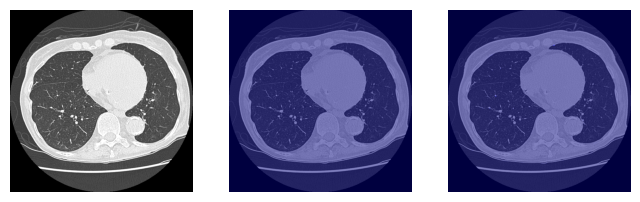

EarlyStopping counter: 13 out of 20
Epoch 101/300	LR: 1e-05
          Train_loss: 0.0939862	Train_dice_loss-> 0.09305457492839685


Train:   0%|          | 0/285 [00:00<?, ?it/s]

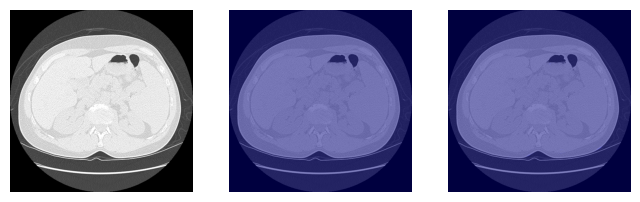

EarlyStopping counter: 14 out of 20
Epoch 102/300	LR: 1e-05
          Train_loss: 0.1018850	Train_dice_loss-> 0.10084945169078782


Train:   0%|          | 0/285 [00:00<?, ?it/s]

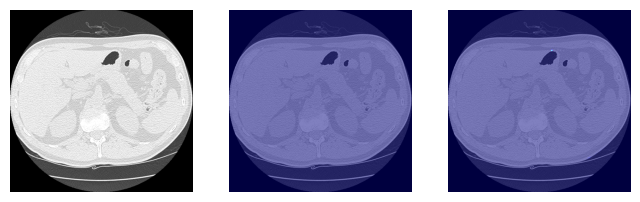

EarlyStopping counter: 15 out of 20
Epoch 103/300	LR: 1e-05
          Train_loss: 0.0993364	Train_dice_loss-> 0.09830601074962243


Train:   0%|          | 0/285 [00:00<?, ?it/s]

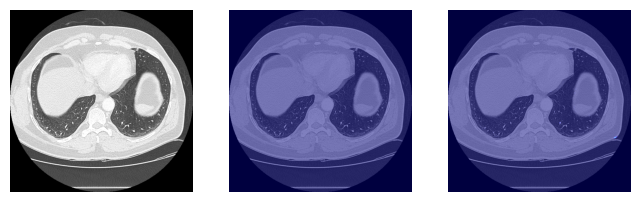

EarlyStopping counter: 16 out of 20
Epoch 104/300	LR: 1e-05
          Train_loss: 0.1023912	Train_dice_loss-> 0.10145845226706109


Train:   0%|          | 0/285 [00:00<?, ?it/s]

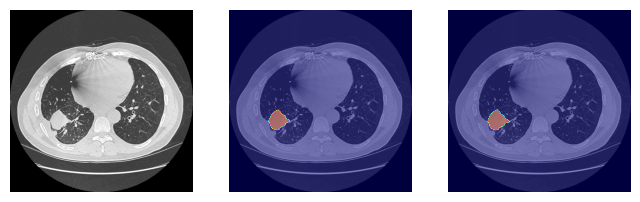

EarlyStopping counter: 17 out of 20
Epoch 105/300	LR: 1e-06
          Train_loss: 0.0817683	Train_dice_loss-> 0.08088078642383928


Train:   0%|          | 0/285 [00:00<?, ?it/s]

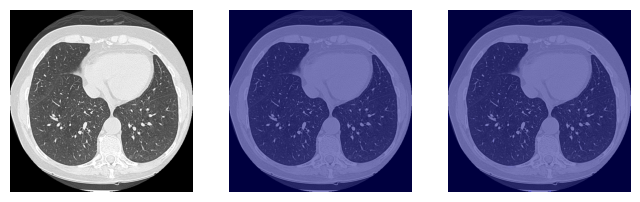

Validation loss decreased (0.080069 --> 0.076911).  Saving model ...
Epoch 106/300	LR: 1e-06
          Train_loss: 0.0769107	Train_dice_loss-> 0.07581085363499962


Train:   0%|          | 0/285 [00:00<?, ?it/s]

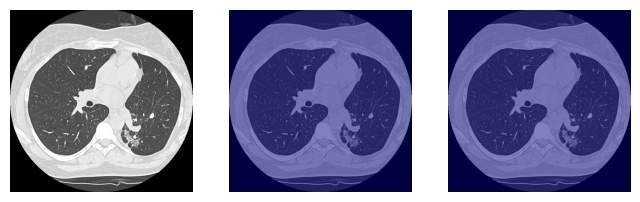

EarlyStopping counter: 1 out of 20
Epoch 107/300	LR: 1e-06
          Train_loss: 0.0929483	Train_dice_loss-> 0.09208295877570243


Train:   0%|          | 0/285 [00:00<?, ?it/s]

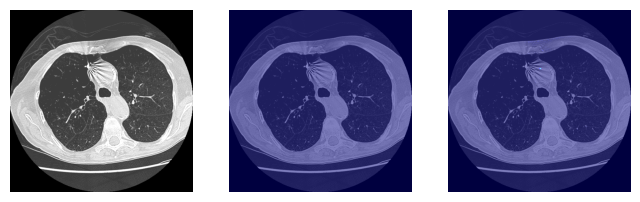

EarlyStopping counter: 2 out of 20
Epoch 108/300	LR: 1e-06
          Train_loss: 0.0913147	Train_dice_loss-> 0.09040282067820885


Train:   0%|          | 0/285 [00:00<?, ?it/s]

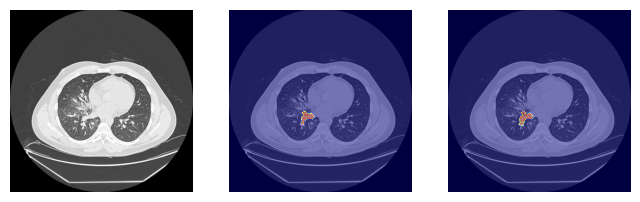

EarlyStopping counter: 3 out of 20
Epoch 109/300	LR: 1e-06
          Train_loss: 0.0924006	Train_dice_loss-> 0.09145242024243362


Train:   0%|          | 0/285 [00:00<?, ?it/s]

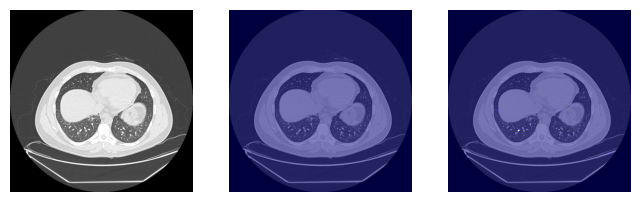

EarlyStopping counter: 4 out of 20
Epoch 110/300	LR: 1e-06
          Train_loss: 0.0873661	Train_dice_loss-> 0.08636086580649074


Train:   0%|          | 0/285 [00:00<?, ?it/s]

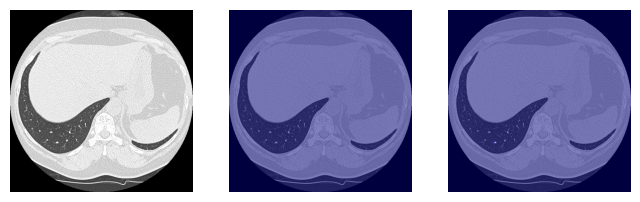

EarlyStopping counter: 5 out of 20
Epoch 111/300	LR: 1e-06
          Train_loss: 0.0877296	Train_dice_loss-> 0.08675447484211093


Train:   0%|          | 0/285 [00:00<?, ?it/s]

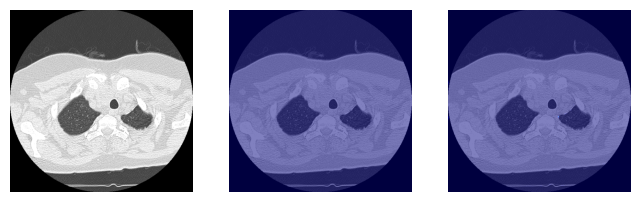

EarlyStopping counter: 6 out of 20
Epoch 112/300	LR: 1e-06
          Train_loss: 0.0992501	Train_dice_loss-> 0.09818937992740531


Train:   0%|          | 0/285 [00:00<?, ?it/s]

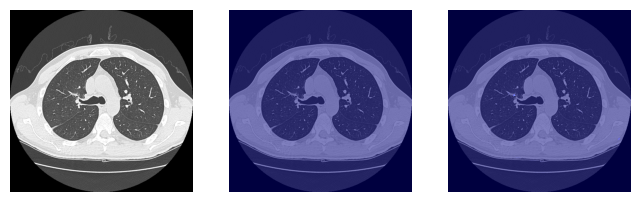

EarlyStopping counter: 7 out of 20
Epoch 113/300	LR: 1e-06
          Train_loss: 0.0903927	Train_dice_loss-> 0.08947767569085735


Train:   0%|          | 0/285 [00:00<?, ?it/s]

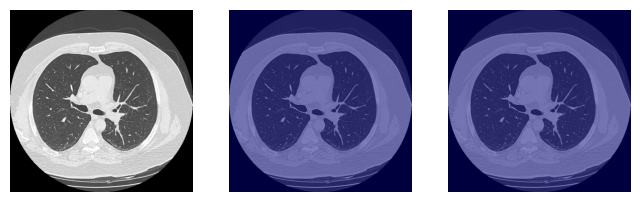

EarlyStopping counter: 8 out of 20
Epoch 114/300	LR: 1e-06
          Train_loss: 0.0960597	Train_dice_loss-> 0.09511077421048374


Train:   0%|          | 0/285 [00:00<?, ?it/s]

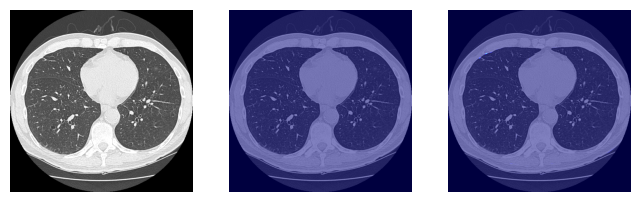

EarlyStopping counter: 9 out of 20
Epoch 115/300	LR: 1e-07
          Train_loss: 0.0908294	Train_dice_loss-> 0.08990395155562801


Train:   0%|          | 0/285 [00:00<?, ?it/s]

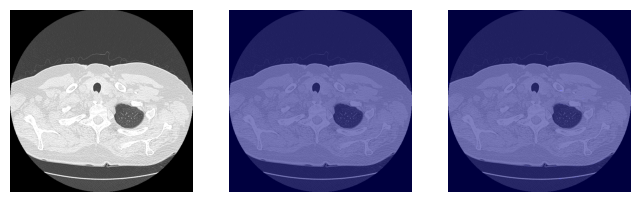

EarlyStopping counter: 10 out of 20
Epoch 116/300	LR: 1e-07
          Train_loss: 0.0977933	Train_dice_loss-> 0.09677770315382775


Train:   0%|          | 0/285 [00:00<?, ?it/s]

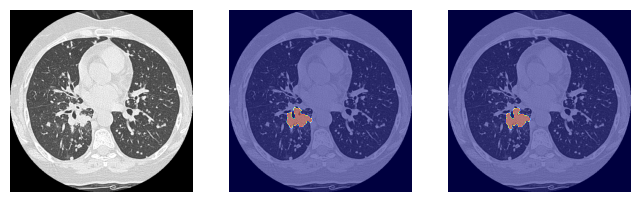

EarlyStopping counter: 11 out of 20
Epoch 117/300	LR: 1e-07
          Train_loss: 0.0826422	Train_dice_loss-> 0.08173714382678329


Train:   0%|          | 0/285 [00:00<?, ?it/s]

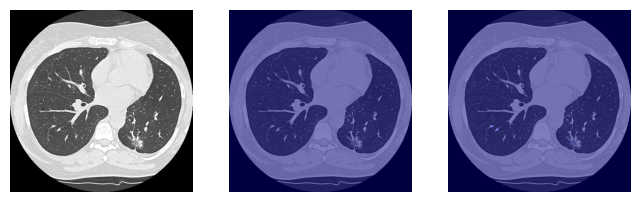

EarlyStopping counter: 12 out of 20
Epoch 118/300	LR: 1e-07
          Train_loss: 0.0923662	Train_dice_loss-> 0.09140906944769446


Train:   0%|          | 0/285 [00:00<?, ?it/s]

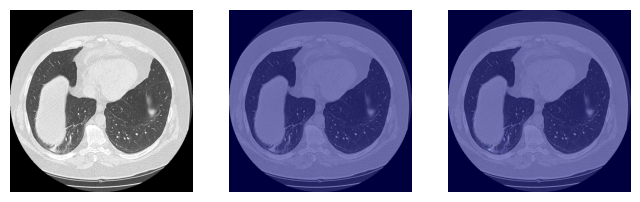

EarlyStopping counter: 13 out of 20
Epoch 119/300	LR: 1e-07
          Train_loss: 0.0901540	Train_dice_loss-> 0.08911530230496381


Train:   0%|          | 0/285 [00:00<?, ?it/s]

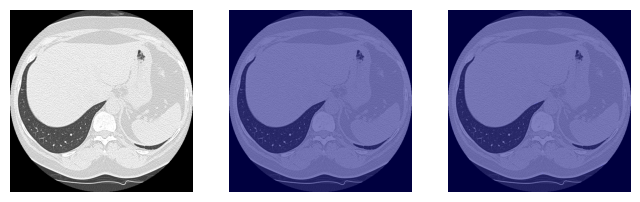

EarlyStopping counter: 14 out of 20
Epoch 120/300	LR: 1e-07
          Train_loss: 0.0806136	Train_dice_loss-> 0.07969618418588137


Train:   0%|          | 0/285 [00:00<?, ?it/s]

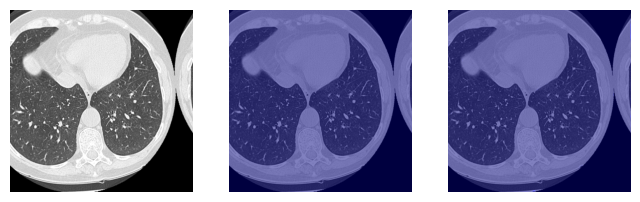

EarlyStopping counter: 15 out of 20
Epoch 121/300	LR: 1e-07
          Train_loss: 0.0936344	Train_dice_loss-> 0.09264551519273638


Train:   0%|          | 0/285 [00:00<?, ?it/s]

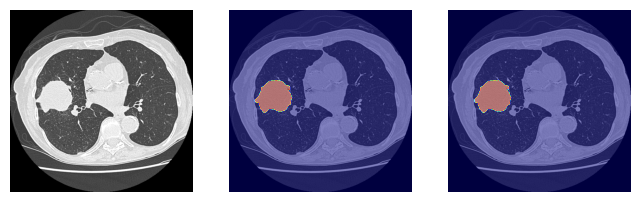

EarlyStopping counter: 16 out of 20
Epoch 122/300	LR: 1e-07
          Train_loss: 0.0942811	Train_dice_loss-> 0.09331002693285237


Train:   0%|          | 0/285 [00:00<?, ?it/s]

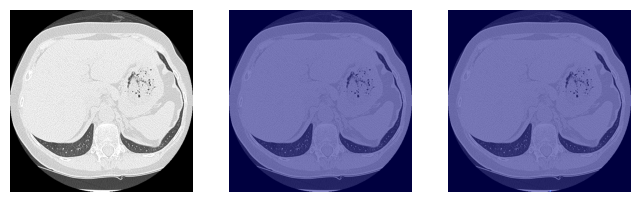

EarlyStopping counter: 17 out of 20
Epoch 123/300	LR: 1e-08
          Train_loss: 0.0941012	Train_dice_loss-> 0.09311574675229534


Train:   0%|          | 0/285 [00:00<?, ?it/s]

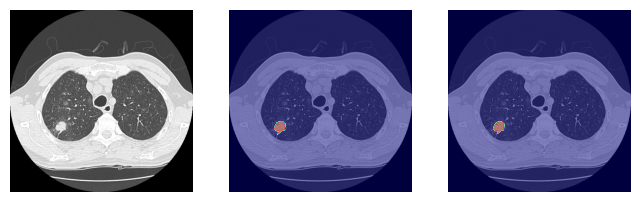

EarlyStopping counter: 18 out of 20
Epoch 124/300	LR: 1e-08
          Train_loss: 0.0888093	Train_dice_loss-> 0.08776497196506809


Train:   0%|          | 0/285 [00:00<?, ?it/s]

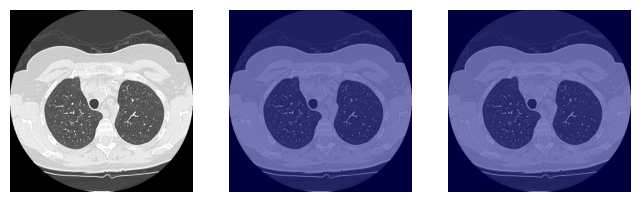

EarlyStopping counter: 19 out of 20
Epoch 125/300	LR: 1e-08
          Train_loss: 0.1007722	Train_dice_loss-> 0.09971170963965466


Train:   0%|          | 0/285 [00:00<?, ?it/s]

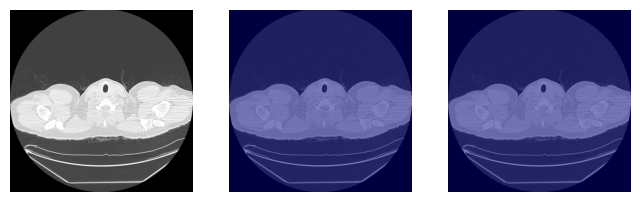

EarlyStopping counter: 20 out of 20
Train early stopped, Minimum validation loss: 0.07691071800450414


In [13]:
metric_logger = {k:[] for k in ['train_loss','train_dice','lr']}

total_train_num = len(train_dataloader.sampler)

for epoch in range(h_params.total_epoch):
    for param in optim.param_groups:
        lr_stauts = param['lr']
    metric_logger['lr'].append(lr_stauts)
    epoch_loss = {k:0 for k in metric_logger if k not in ['lr']}
    model.train()

    for batch_idx, data in enumerate(tqdm(train_dataloader, total=len(train_dataloader), position=0, desc='Train', colour='blue')):
        batch_num = len(data['image'])
        
        image = data['image'].to(device, dtype=torch.float)
        target = data['mask'].to(device, dtype=torch.long)
        
        pred = model(image)
        
        focal_loss = criterion_focal(pred, target)
        dice_loss = criterion_dice(pred, target)
        loss = focal_loss + dice_loss
        
        optim.zero_grad()
        loss.backward()
        optim.step()
        
        if batch_idx ==0:
            train_show(image,target,pred.sigmoid())
        
        epoch_loss['train_dice'] += dice_loss.item()*batch_num
        epoch_loss['train_loss'] += loss.item()*batch_num

    epoch_loss = {k:(v/total_train_num if 'train' in k else v/total_val_num) for k,v in epoch_loss.items()}

    monitor(epoch_loss['train_loss'], model)
    if monitor.early_stop:
        print(f"Train early stopped, Minimum validation loss: {monitor.val_loss_min}")
        break
    
    scheduler.step(epoch_loss['train_loss'])

    print(f"Epoch {epoch+1:03d}/{h_params.total_epoch:03d}\tLR: {lr_stauts:.0e}\n\
          Train_loss: {epoch_loss['train_loss']:.7f}\tTrain_dice_loss-> {epoch_loss['train_dice']}")